In [ ]:
# TensorFlow and tf.keras
import tensorflow as tf
# Helper libraries
import numpy as np
import cv2
import matplotlib.pyplot as plt
import random
import tensorflow_datasets as tfds
import os
import PIL
import PIL.Image
import keras
import gc

In [ ]:
#Start by connecting gdrive into the google colab
from google.colab import drive
drive.mount("/content/gdrive")

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


In [ ]:
os.chdir("/content/gdrive/MyDrive/Saved images")
!pwd

/content/gdrive/MyDrive/Saved images


In [ ]:
#unzips the zip file
"""
import zipfile
import os

zip_ref = zipfile.ZipFile('/content/gdrive/MyDrive/celeba.zip', 'r')
zip_ref.extractall('/tmp') #Extracts the files into the /tmp folder
zip_ref.close()
"""

"\nimport zipfile\nimport os\n\nzip_ref = zipfile.ZipFile('/content/gdrive/MyDrive/celeba.zip', 'r')\nzip_ref.extractall('/tmp') #Extracts the files into the /tmp folder\nzip_ref.close()\n"

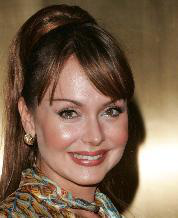

In [ ]:
filePath = "/content/gdrive/MyDrive/celeba"
sampleImage = PIL.Image.open("/tmp/img_align_celeba/000009.jpg")
sampleImage

In [ ]:
dataset = tf.data.Dataset.list_files('/tmp/img_align_celeba/*.jpg', shuffle=True)
image_count = len(os.listdir('/tmp/img_align_celeba/'))

scale = 1.0
dataset = dataset.take(int(image_count * scale))
val_size = int(image_count * scale * 0.1)
trainData = dataset.skip(int(val_size))
valData = dataset.take(val_size)
print(tf.data.experimental.cardinality(trainData).numpy())
print(tf.data.experimental.cardinality(valData).numpy())

182340
20259


In [ ]:
def decode_img(file_path):
  img = tf.io.read_file(file_path)
  # convert the compressed string to a 3D uint8 tensor
  img = tf.io.decode_jpeg(img, channels=3)
  img = tf.image.crop_to_bounding_box(img, 20, 0, 178, 178)
  #img = tf.image.rgb_to_grayscale(img)
  img = img / 255
  # resize the image to the desired size
  return tf.image.resize(img, [96, 96])

trainData = trainData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)
valData = valData.map(decode_img, num_parallel_calls=tf.data.AUTOTUNE)

Image shape:  (96, 96, 3)


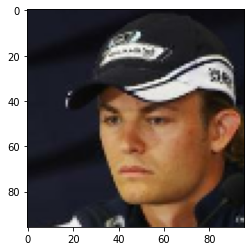

In [ ]:
for image in trainData.take(1):
  plt.imshow(image.numpy())
  #print(image)
  print("Image shape: ", image.numpy().shape)

In [ ]:
# Generation resolution - Must be square 
# Training data is also scaled to this.
# Note GENERATE_RES 4 or higher  
# will blow Google CoLab's memory and have not
# been tested extensivly.
GENERATE_RES = 3 # Generation resolution factor 
# (1=32, 2=64, 3=96, 4=128, etc.)
GENERATE_SQUARE = 32 * GENERATE_RES # rows/cols (should be square)
IMAGE_CHANNELS = 3

# Preview image 
PREVIEW_ROWS = 4
PREVIEW_COLS = 7
PREVIEW_MARGIN = 16

# Size vector to generate images from
SEED_SIZE = 200

# Configuration
DATA_PATH = '/content/drive/My Drive/projects/faces'
EPOCHS = 50
BATCH_SIZE = 64
BUFFER_SIZE = 60000

In [ ]:
batchSize = BATCH_SIZE
#trainData = trainData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
#valData = valData.cache().prefetch(buffer_size=tf.data.AUTOTUNE)
trainData = trainData.batch(batchSize)
valData = valData.batch(batchSize)

In [ ]:
from tensorflow.keras.layers import Input, Reshape, Dropout, Dense 
from tensorflow.keras.layers import Flatten, BatchNormalization
from tensorflow.keras.layers import Activation, ZeroPadding2D
from tensorflow.keras.layers import LeakyReLU
from tensorflow.keras.layers import UpSampling2D, Conv2D, Conv2DTranspose
from tensorflow.keras.models import Sequential, Model, load_model
from tensorflow.keras.optimizers import Adam

init = tf.keras.initializers.HeNormal
regularizer = tf.keras.regularizers.L2(0.01)
def build_generator(seed_size, channels):
    model = Sequential()

    model.add(Dense(12*12*512,activation="relu",input_dim=seed_size, kernel_initializer = init))
    model.add(Reshape((12,12,512)))

    model.add(Conv2DTranspose(256 ,kernel_size=4, strides = (2,2), padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(Conv2DTranspose(128 ,kernel_size=4, strides = (2,2), padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))
   
    model.add(Conv2DTranspose(64 ,kernel_size=4, strides = (2,2), padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(Activation("relu"))

    model.add(Conv2D(channels,kernel_size=3,padding="same"))
    model.add(Activation("sigmoid"))

    return model


def build_discriminator(image_shape):
    model = Sequential()

    model.add(Conv2D(32, kernel_size=4, strides=2, input_shape=image_shape, padding="same", kernel_initializer = init))
    model.add(LeakyReLU(alpha=0.2))

    #model.add(Dropout(0.3))
    model.add(Conv2D(64, kernel_size=4, strides=2, padding="same", kernel_initializer = init))
    model.add(ZeroPadding2D(padding=((0,1),(0,1))))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    #model.add(Dropout(0.3))
    model.add(Conv2D(128, kernel_size=4, strides=2, padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    #model.add(Dropout(0.3))
    model.add(Conv2D(256, kernel_size=4, strides=2, padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    #model.add(Dropout(0.3))
    model.add(Conv2D(512, kernel_size=4, strides=2, padding="same", kernel_initializer = init))
    model.add(BatchNormalization(momentum=0.8))
    model.add(LeakyReLU(alpha=0.2))

    #model.add(Dropout(0.3))
    model.add(Flatten())
    model.add(Dense(1, activation='sigmoid'))

    return model

(1, 96, 96, 3)


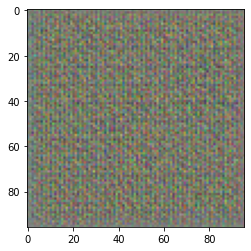

In [ ]:
generator = build_generator(SEED_SIZE, IMAGE_CHANNELS)
#generator = keras.models.load_model("/content/gdrive/MyDrive/generator-VSN", compile=False)

noise = tf.random.normal([1, SEED_SIZE])
generated_image = generator(noise, training=False)

#print(generated_image)
plt.imshow(generated_image[0])
#plt.savefig("generatedImage")
print(generated_image.shape)

In [ ]:
image_shape = (GENERATE_SQUARE,GENERATE_SQUARE,IMAGE_CHANNELS)

discriminator = build_discriminator(image_shape)
#discriminator = keras.models.load_model("/content/gdrive/MyDrive/discriminator-VSN", compile=False)
decision = discriminator(generated_image)
print (decision)

tf.Tensor([[0.7634696]], shape=(1, 1), dtype=float32)


In [ ]:
cross_entropy = tf.keras.losses.BinaryCrossentropy()
mse = tf.keras.losses.MeanSquaredError()
hloss = tf.keras.losses.Hinge()

def discriminator_loss(real_output, fake_output):
  real_loss = cross_entropy(tf.ones_like(real_output), real_output)
  fake_loss = cross_entropy(tf.zeros_like(fake_output), fake_output)
  loss = real_loss + fake_loss
  return loss
  
def generator_loss(fake_output):
    return cross_entropy(tf.ones_like(fake_output), fake_output)

In [ ]:
generator_optimizer = tf.keras.optimizers.Adam(0.0001,0.5)
discriminator_optimizer = tf.keras.optimizers.Adam(0.0001,0.5)

In [ ]:
@tf.function
def train_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    generated_images = generator(seed, training=True)

    real_output = discriminator(images, training=True)
    fake_output = discriminator(generated_images, training=True)

    gen_loss = generator_loss(fake_output)
    disc_loss = discriminator_loss(real_output, fake_output)
    
    gradients_of_generator = gen_tape.gradient(gen_loss, generator.trainable_variables)
    gradients_of_discriminator = disc_tape.gradient(disc_loss, discriminator.trainable_variables)

    generator_optimizer.apply_gradients(zip(gradients_of_generator, generator.trainable_variables))
    discriminator_optimizer.apply_gradients(zip(gradients_of_discriminator, discriminator.trainable_variables))
  return gen_loss,disc_loss

In [ ]:
@tf.function
def val_step(images):
  seed = tf.random.normal([BATCH_SIZE, SEED_SIZE])

  generated_images = generator(seed, training=False)

  real_output = discriminator(images, training=False)
  fake_output = discriminator(generated_images, training=False)

  return real_output,fake_output

600
tf.Tensor(4.203283, shape=(), dtype=float32) tf.Tensor(0.23190875, shape=(), dtype=float32)


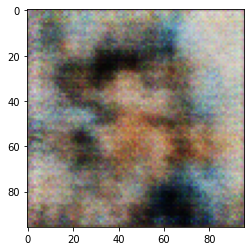

1200
tf.Tensor(3.7563927, shape=(), dtype=float32) tf.Tensor(0.27457306, shape=(), dtype=float32)


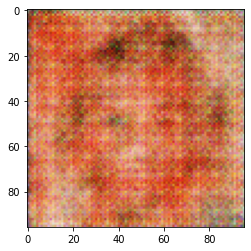

1800
tf.Tensor(3.5340354, shape=(), dtype=float32) tf.Tensor(0.3014505, shape=(), dtype=float32)


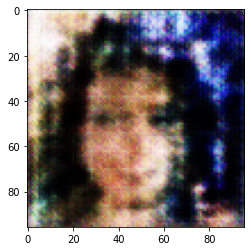

2400
tf.Tensor(3.3807783, shape=(), dtype=float32) tf.Tensor(0.30885127, shape=(), dtype=float32)


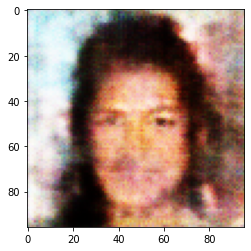

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 1, gen loss=3.3383543491363525,disc loss=0.30675432085990906,
Accuracy:  0.5771508958981194
Accuracy on fake:  0.16219951626437631
600
tf.Tensor(3.0685923, shape=(), dtype=float32) tf.Tensor(0.26920143, shape=(), dtype=float32)


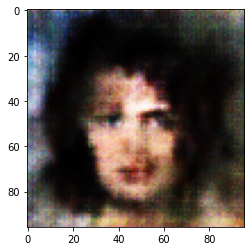

1200
tf.Tensor(3.1520984, shape=(), dtype=float32) tf.Tensor(0.26199088, shape=(), dtype=float32)


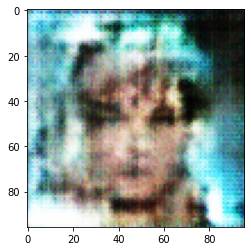

1800
tf.Tensor(3.2042272, shape=(), dtype=float32) tf.Tensor(0.25100878, shape=(), dtype=float32)


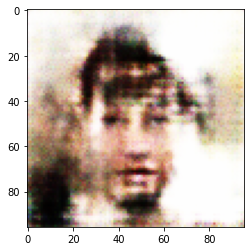

2400
tf.Tensor(3.2460072, shape=(), dtype=float32) tf.Tensor(0.25063932, shape=(), dtype=float32)


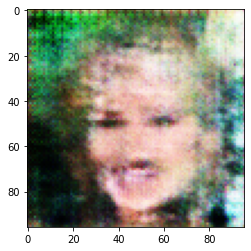

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 2, gen loss=3.270761489868164,disc loss=0.24898064136505127,
Accuracy:  0.5557776790562219
Accuracy on fake:  0.12823930105138456
600
tf.Tensor(3.4296355, shape=(), dtype=float32) tf.Tensor(0.2605842, shape=(), dtype=float32)


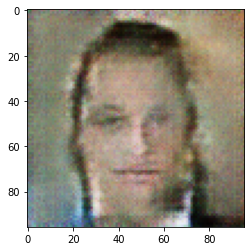

1200
tf.Tensor(3.417606, shape=(), dtype=float32) tf.Tensor(0.2537987, shape=(), dtype=float32)


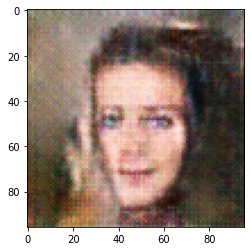

1800
tf.Tensor(3.4284213, shape=(), dtype=float32) tf.Tensor(0.25142506, shape=(), dtype=float32)


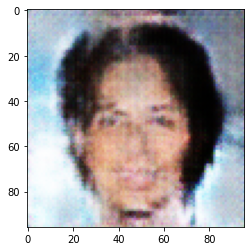

2400
tf.Tensor(3.418955, shape=(), dtype=float32) tf.Tensor(0.25019863, shape=(), dtype=float32)


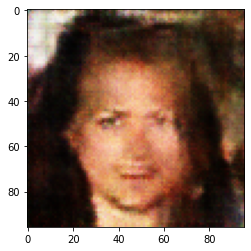

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 3, gen loss=3.4268105030059814,disc loss=0.2491430640220642,
Accuracy:  0.6240929957056123
Accuracy on fake:  0.2633397502344637
600
tf.Tensor(3.4574862, shape=(), dtype=float32) tf.Tensor(0.23516637, shape=(), dtype=float32)


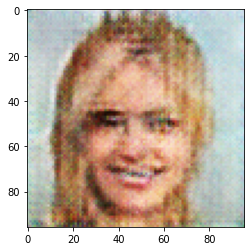

1200
tf.Tensor(3.4769056, shape=(), dtype=float32) tf.Tensor(0.23711129, shape=(), dtype=float32)


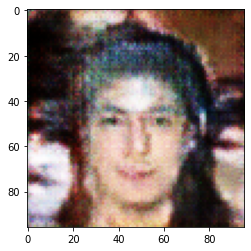

1800
tf.Tensor(3.496907, shape=(), dtype=float32) tf.Tensor(0.2317364, shape=(), dtype=float32)


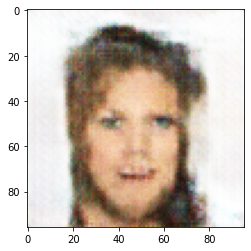

2400
tf.Tensor(3.5427408, shape=(), dtype=float32) tf.Tensor(0.22127011, shape=(), dtype=float32)


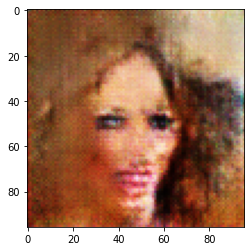

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 4, gen loss=3.5347142219543457,disc loss=0.22925299406051636,
Accuracy:  0.5021471938397749
Accuracy on fake:  0.00434374845747569
600
tf.Tensor(3.5334806, shape=(), dtype=float32) tf.Tensor(0.24172692, shape=(), dtype=float32)


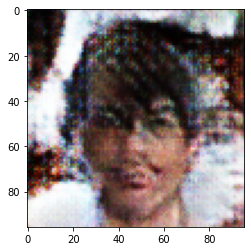

1200
tf.Tensor(3.5206442, shape=(), dtype=float32) tf.Tensor(0.23735087, shape=(), dtype=float32)


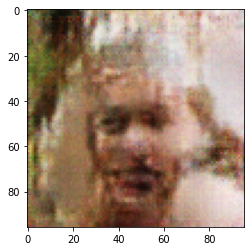

1800
tf.Tensor(3.4867816, shape=(), dtype=float32) tf.Tensor(0.25537694, shape=(), dtype=float32)


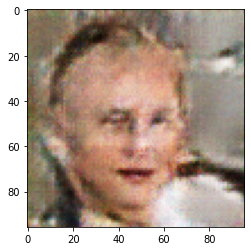

2400
tf.Tensor(3.485936, shape=(), dtype=float32) tf.Tensor(0.2557845, shape=(), dtype=float32)


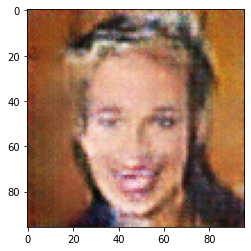

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 5, gen loss=3.4596288204193115,disc loss=0.25546103715896606,
Accuracy:  0.5191766622241967
Accuracy on fake:  0.03938990078483637
600
tf.Tensor(3.4204304, shape=(), dtype=float32) tf.Tensor(0.25237614, shape=(), dtype=float32)


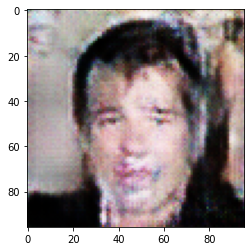

1200
tf.Tensor(3.4543457, shape=(), dtype=float32) tf.Tensor(0.24069911, shape=(), dtype=float32)


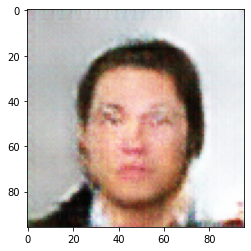

1800
tf.Tensor(3.466655, shape=(), dtype=float32) tf.Tensor(0.24500081, shape=(), dtype=float32)


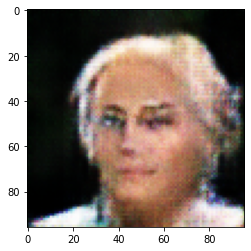

2400
tf.Tensor(3.4609563, shape=(), dtype=float32) tf.Tensor(0.25380063, shape=(), dtype=float32)


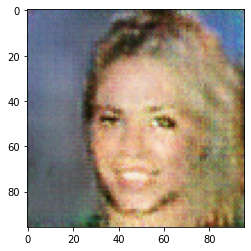

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 6, gen loss=3.4786458015441895,disc loss=0.24569232761859894,
Accuracy:  0.8058393800286292
Accuracy on fake:  0.6497852806160225
600
tf.Tensor(3.5094805, shape=(), dtype=float32) tf.Tensor(0.2961662, shape=(), dtype=float32)


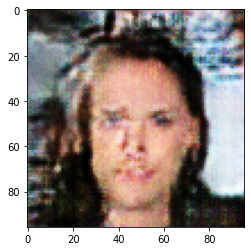

1200
tf.Tensor(3.5073564, shape=(), dtype=float32) tf.Tensor(0.26089832, shape=(), dtype=float32)


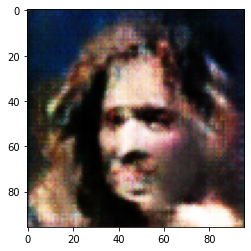

1800
tf.Tensor(3.5393927, shape=(), dtype=float32) tf.Tensor(0.24136429, shape=(), dtype=float32)


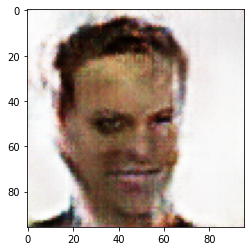

2400
tf.Tensor(3.5075593, shape=(), dtype=float32) tf.Tensor(0.25208035, shape=(), dtype=float32)


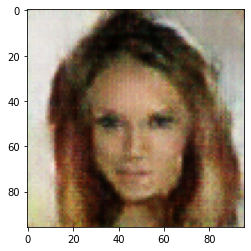

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 7, gen loss=3.514867067337036,disc loss=0.246541827917099,
Accuracy:  0.578656399624858
Accuracy on fake:  0.16600029616466755
600
tf.Tensor(3.6503344, shape=(), dtype=float32) tf.Tensor(0.21163313, shape=(), dtype=float32)


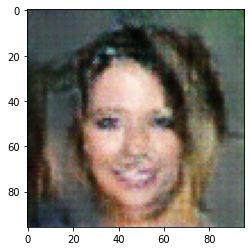

1200
tf.Tensor(3.6416218, shape=(), dtype=float32) tf.Tensor(0.23160629, shape=(), dtype=float32)


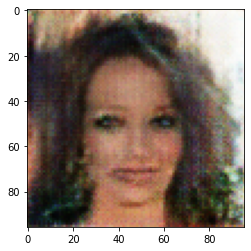

1800
tf.Tensor(3.6616185, shape=(), dtype=float32) tf.Tensor(0.22387022, shape=(), dtype=float32)


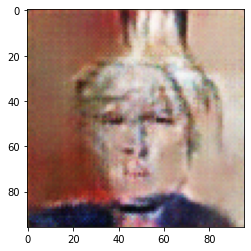

2400
tf.Tensor(3.6243062, shape=(), dtype=float32) tf.Tensor(0.23788343, shape=(), dtype=float32)


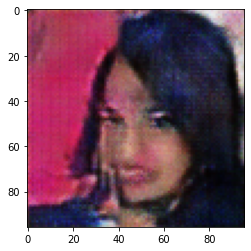

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 8, gen loss=3.6141576766967773,disc loss=0.24169372022151947,
Accuracy:  0.610420060220149
Accuracy on fake:  0.2829359790710302
600
tf.Tensor(3.7081628, shape=(), dtype=float32) tf.Tensor(0.19319616, shape=(), dtype=float32)


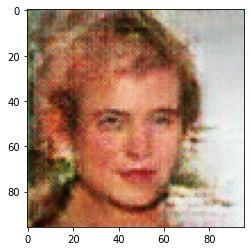

1200
tf.Tensor(3.7256274, shape=(), dtype=float32) tf.Tensor(0.19624594, shape=(), dtype=float32)


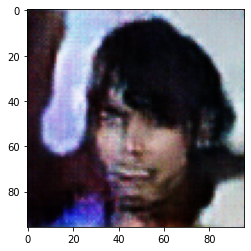

1800
tf.Tensor(3.7370229, shape=(), dtype=float32) tf.Tensor(0.20129046, shape=(), dtype=float32)


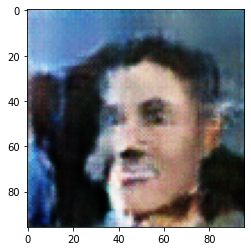

2400
tf.Tensor(3.7140043, shape=(), dtype=float32) tf.Tensor(0.21000485, shape=(), dtype=float32)


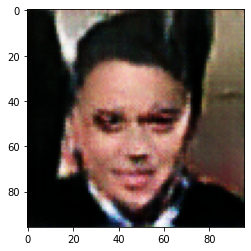

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 9, gen loss=3.7209956645965576,disc loss=0.20595887303352356,
Accuracy:  0.8496223900488672
Accuracy on fake:  0.745594550570117
600
tf.Tensor(3.8060596, shape=(), dtype=float32) tf.Tensor(0.25719082, shape=(), dtype=float32)


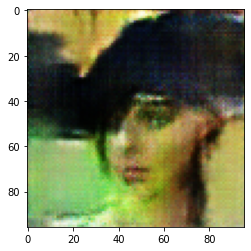

1200
tf.Tensor(3.7792962, shape=(), dtype=float32) tf.Tensor(0.23580635, shape=(), dtype=float32)


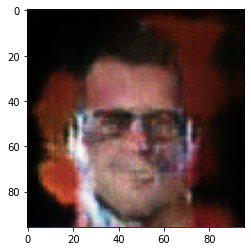

1800
tf.Tensor(3.7762961, shape=(), dtype=float32) tf.Tensor(0.23258592, shape=(), dtype=float32)


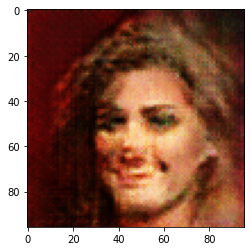

2400
tf.Tensor(3.7938635, shape=(), dtype=float32) tf.Tensor(0.21729045, shape=(), dtype=float32)


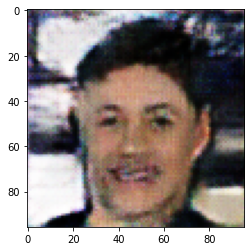

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 10, gen loss=3.801518678665161,disc loss=0.21957246959209442,
Accuracy:  0.5159435312700528
Accuracy on fake:  0.034157658324695195
600
tf.Tensor(3.8243332, shape=(), dtype=float32) tf.Tensor(0.21783519, shape=(), dtype=float32)


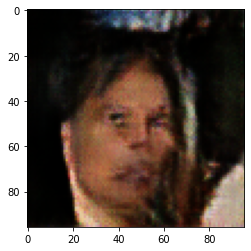

1200
tf.Tensor(3.838832, shape=(), dtype=float32) tf.Tensor(0.21385862, shape=(), dtype=float32)


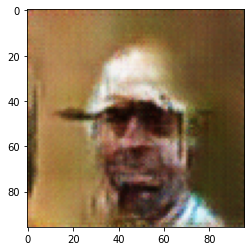

1800
tf.Tensor(3.8563926, shape=(), dtype=float32) tf.Tensor(0.21092652, shape=(), dtype=float32)


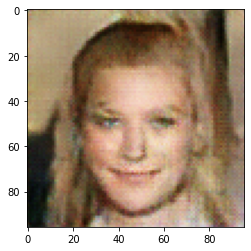

2400
tf.Tensor(3.8443604, shape=(), dtype=float32) tf.Tensor(0.21392672, shape=(), dtype=float32)


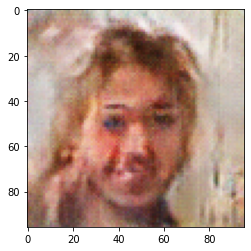

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 11, gen loss=3.8404791355133057,disc loss=0.21339993178844452,
Accuracy:  0.7799743323954785
Accuracy on fake:  0.960807542326867
600
tf.Tensor(3.9416595, shape=(), dtype=float32) tf.Tensor(0.19457044, shape=(), dtype=float32)


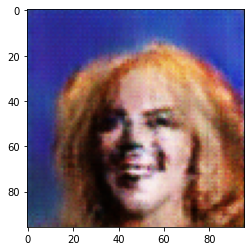

1200
tf.Tensor(3.9223166, shape=(), dtype=float32) tf.Tensor(0.1989939, shape=(), dtype=float32)


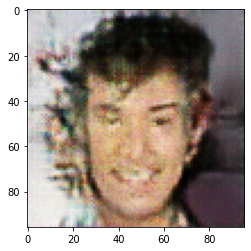

1800
tf.Tensor(3.9027321, shape=(), dtype=float32) tf.Tensor(0.2083809, shape=(), dtype=float32)


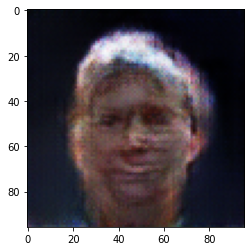

2400
tf.Tensor(3.9156723, shape=(), dtype=float32) tf.Tensor(0.2045632, shape=(), dtype=float32)


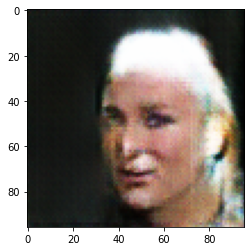

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 12, gen loss=3.903881549835205,disc loss=0.20465469360351562,
Accuracy:  0.5047139542919197
Accuracy on fake:  0.010661928031985785
600
tf.Tensor(3.8838403, shape=(), dtype=float32) tf.Tensor(0.21020229, shape=(), dtype=float32)


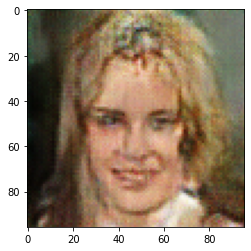

1200
tf.Tensor(3.8818543, shape=(), dtype=float32) tf.Tensor(0.22815043, shape=(), dtype=float32)


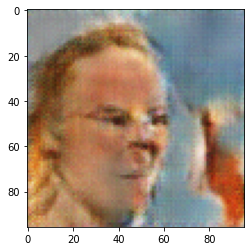

1800
tf.Tensor(3.9068305, shape=(), dtype=float32) tf.Tensor(0.2111489, shape=(), dtype=float32)


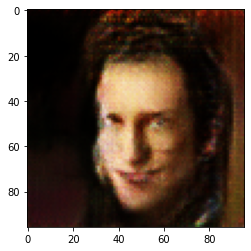

2400
tf.Tensor(3.903837, shape=(), dtype=float32) tf.Tensor(0.21028662, shape=(), dtype=float32)


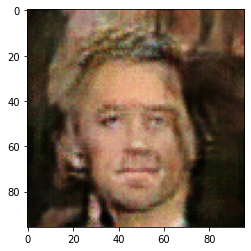

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 13, gen loss=3.8989572525024414,disc loss=0.21198363602161407,
Accuracy:  0.5136976158744262
Accuracy on fake:  0.032627474208993534
600
tf.Tensor(3.8448298, shape=(), dtype=float32) tf.Tensor(0.25270045, shape=(), dtype=float32)


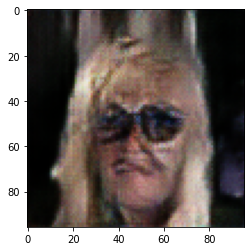

1200
tf.Tensor(3.927284, shape=(), dtype=float32) tf.Tensor(0.20290333, shape=(), dtype=float32)


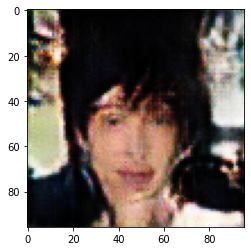

1800
tf.Tensor(3.9579551, shape=(), dtype=float32) tf.Tensor(0.20855072, shape=(), dtype=float32)


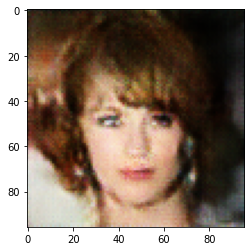

2400
tf.Tensor(3.9876077, shape=(), dtype=float32) tf.Tensor(0.19772081, shape=(), dtype=float32)


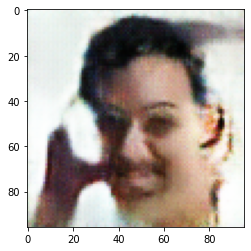

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 14, gen loss=3.9947235584259033,disc loss=0.19920054078102112,
Accuracy:  0.8378745249025125
Accuracy on fake:  0.7996939631768597
600
tf.Tensor(4.0957975, shape=(), dtype=float32) tf.Tensor(0.21977223, shape=(), dtype=float32)


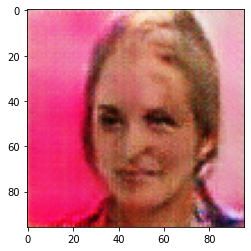

1200
tf.Tensor(4.05863, shape=(), dtype=float32) tf.Tensor(0.19546142, shape=(), dtype=float32)


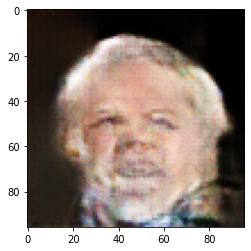

1800
tf.Tensor(4.047303, shape=(), dtype=float32) tf.Tensor(0.20435606, shape=(), dtype=float32)


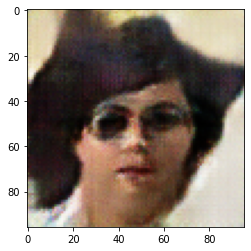

2400
tf.Tensor(4.0402756, shape=(), dtype=float32) tf.Tensor(0.20112832, shape=(), dtype=float32)


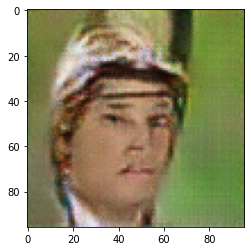

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 15, gen loss=4.031595706939697,disc loss=0.20432700216770172,
Accuracy:  0.8547805913421196
Accuracy on fake:  0.8079372130904783
600
tf.Tensor(4.210207, shape=(), dtype=float32) tf.Tensor(0.14229332, shape=(), dtype=float32)


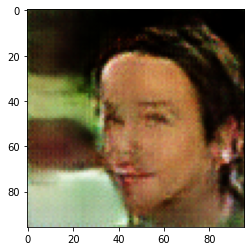

1200
tf.Tensor(4.1673846, shape=(), dtype=float32) tf.Tensor(0.16233596, shape=(), dtype=float32)


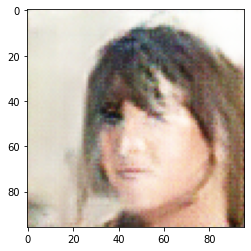

1800
tf.Tensor(4.1525545, shape=(), dtype=float32) tf.Tensor(0.19282785, shape=(), dtype=float32)


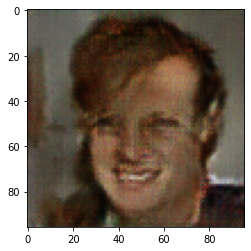

2400
tf.Tensor(4.136579, shape=(), dtype=float32) tf.Tensor(0.17835595, shape=(), dtype=float32)


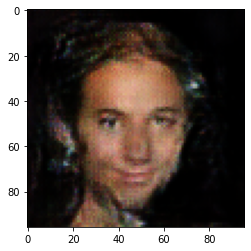

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 16, gen loss=4.146732807159424,disc loss=0.17837895452976227,
Accuracy:  0.8064810701416655
Accuracy on fake:  0.6941112591934449
600
tf.Tensor(4.094492, shape=(), dtype=float32) tf.Tensor(0.21784419, shape=(), dtype=float32)


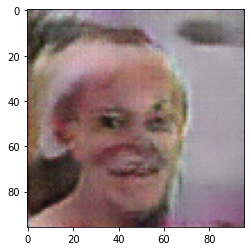

1200
tf.Tensor(4.1488, shape=(), dtype=float32) tf.Tensor(0.19673549, shape=(), dtype=float32)


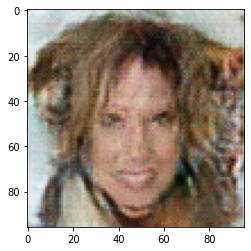

1800
tf.Tensor(4.1654897, shape=(), dtype=float32) tf.Tensor(0.18422155, shape=(), dtype=float32)


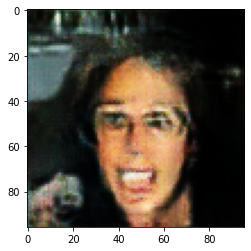

2400
tf.Tensor(4.194431, shape=(), dtype=float32) tf.Tensor(0.18101712, shape=(), dtype=float32)


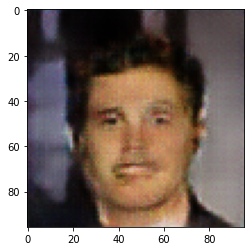

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 17, gen loss=4.195588111877441,disc loss=0.18166659772396088,
Accuracy:  0.8675156720469914
Accuracy on fake:  0.8748704279579446
600
tf.Tensor(4.358652, shape=(), dtype=float32) tf.Tensor(0.16958529, shape=(), dtype=float32)


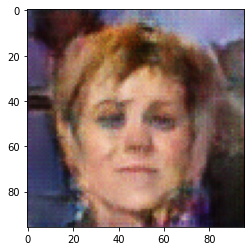

1200
tf.Tensor(4.2879734, shape=(), dtype=float32) tf.Tensor(0.17843905, shape=(), dtype=float32)


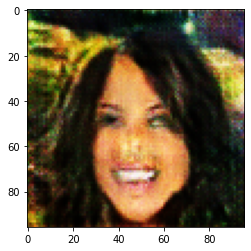

1800
tf.Tensor(4.288526, shape=(), dtype=float32) tf.Tensor(0.17132536, shape=(), dtype=float32)


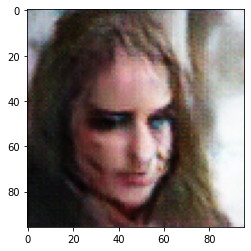

2400
tf.Tensor(4.2688, shape=(), dtype=float32) tf.Tensor(0.17422646, shape=(), dtype=float32)


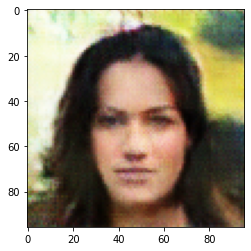

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 18, gen loss=4.292877674102783,disc loss=0.16968095302581787,
Accuracy:  0.7446813761784886
Accuracy on fake:  0.577274297842934
600
tf.Tensor(4.3434844, shape=(), dtype=float32) tf.Tensor(0.17401595, shape=(), dtype=float32)


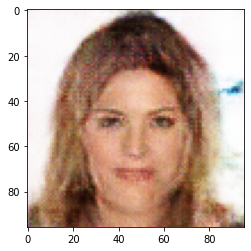

1200
tf.Tensor(4.3283234, shape=(), dtype=float32) tf.Tensor(0.17516091, shape=(), dtype=float32)


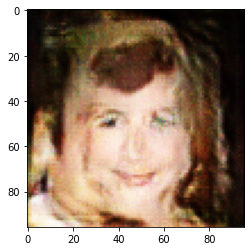

1800
tf.Tensor(4.338249, shape=(), dtype=float32) tf.Tensor(0.1687665, shape=(), dtype=float32)


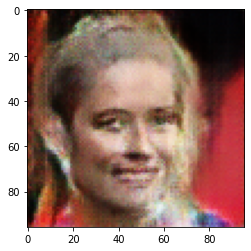

2400
tf.Tensor(4.3307023, shape=(), dtype=float32) tf.Tensor(0.17320427, shape=(), dtype=float32)


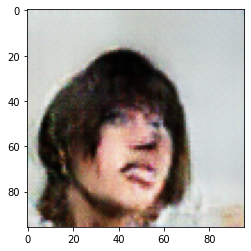

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 19, gen loss=4.353427886962891,disc loss=0.17945294082164764,
Accuracy:  0.643960708820771
Accuracy on fake:  0.3264721852016388
600
tf.Tensor(4.3416123, shape=(), dtype=float32) tf.Tensor(0.15573089, shape=(), dtype=float32)


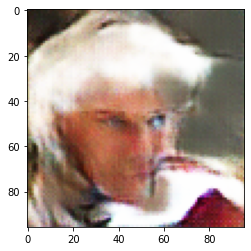

1200
tf.Tensor(4.4020457, shape=(), dtype=float32) tf.Tensor(0.1458784, shape=(), dtype=float32)


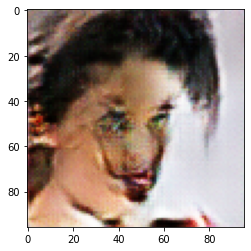

1800
tf.Tensor(4.39039, shape=(), dtype=float32) tf.Tensor(0.15189181, shape=(), dtype=float32)


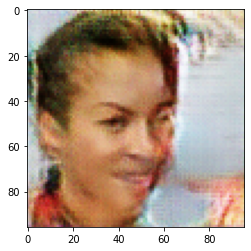

2400
tf.Tensor(4.3485136, shape=(), dtype=float32) tf.Tensor(0.18097539, shape=(), dtype=float32)


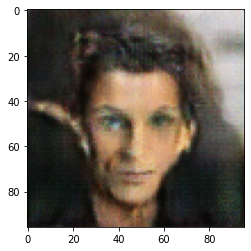

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 20, gen loss=4.339351654052734,disc loss=0.17503617703914642,
Accuracy:  0.8213633446863122
Accuracy on fake:  0.7329581914210967
600
tf.Tensor(4.396877, shape=(), dtype=float32) tf.Tensor(0.14747062, shape=(), dtype=float32)


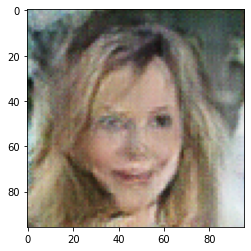

1200
tf.Tensor(4.462258, shape=(), dtype=float32) tf.Tensor(0.14903359, shape=(), dtype=float32)


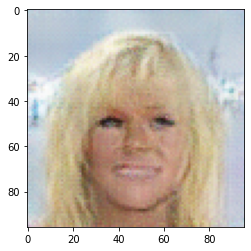

1800
tf.Tensor(4.449093, shape=(), dtype=float32) tf.Tensor(0.15202259, shape=(), dtype=float32)


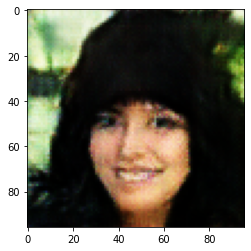

2400
tf.Tensor(4.4032736, shape=(), dtype=float32) tf.Tensor(0.16332439, shape=(), dtype=float32)


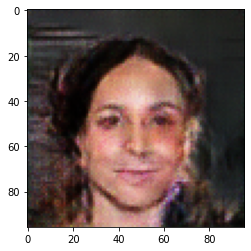

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 21, gen loss=4.4165754318237305,disc loss=0.16274307668209076,
Accuracy:  0.5224344735673034
Accuracy on fake:  1.0005923293351102
600
tf.Tensor(4.477529, shape=(), dtype=float32) tf.Tensor(0.13215266, shape=(), dtype=float32)


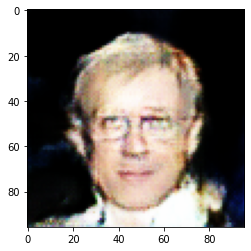

1200
tf.Tensor(4.4243207, shape=(), dtype=float32) tf.Tensor(0.17291838, shape=(), dtype=float32)


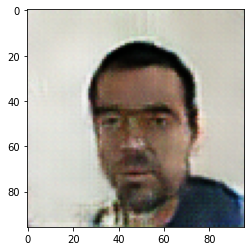

1800
tf.Tensor(4.464522, shape=(), dtype=float32) tf.Tensor(0.15523286, shape=(), dtype=float32)


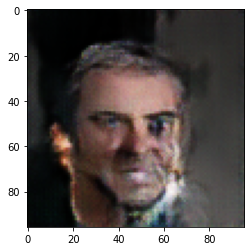

2400
tf.Tensor(4.4532094, shape=(), dtype=float32) tf.Tensor(0.16249146, shape=(), dtype=float32)


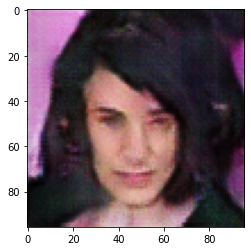

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 22, gen loss=4.462503910064697,disc loss=0.15727289021015167,
Accuracy:  0.7491732069697419
Accuracy on fake:  0.5530381558813366
600
tf.Tensor(4.4061775, shape=(), dtype=float32) tf.Tensor(0.190128, shape=(), dtype=float32)


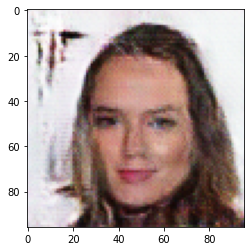

1200
tf.Tensor(4.4695115, shape=(), dtype=float32) tf.Tensor(0.16348723, shape=(), dtype=float32)


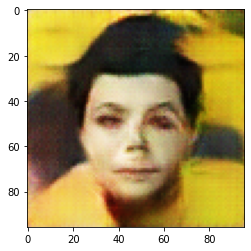

1800
tf.Tensor(4.4925513, shape=(), dtype=float32) tf.Tensor(0.15710096, shape=(), dtype=float32)


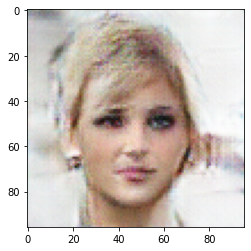

2400
tf.Tensor(4.4714127, shape=(), dtype=float32) tf.Tensor(0.16721828, shape=(), dtype=float32)


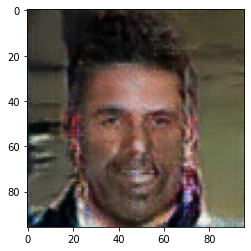

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 23, gen loss=4.486119270324707,disc loss=0.1686302274465561,
Accuracy:  0.5613554469618441
Accuracy on fake:  0.13095414383730689
600
tf.Tensor(4.4235215, shape=(), dtype=float32) tf.Tensor(0.18084583, shape=(), dtype=float32)


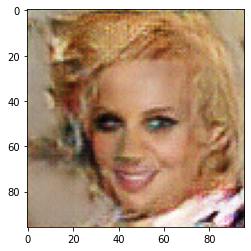

1200
tf.Tensor(4.513498, shape=(), dtype=float32) tf.Tensor(0.1571384, shape=(), dtype=float32)


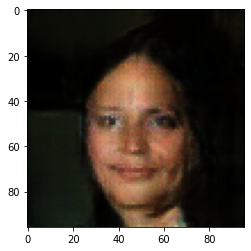

1800
tf.Tensor(4.5178294, shape=(), dtype=float32) tf.Tensor(0.15952314, shape=(), dtype=float32)


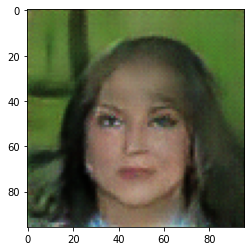

2400
tf.Tensor(4.5330076, shape=(), dtype=float32) tf.Tensor(0.15321034, shape=(), dtype=float32)


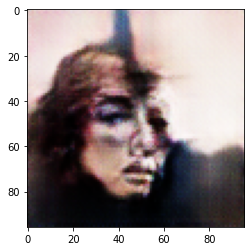

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 24, gen loss=4.530191421508789,disc loss=0.1670072078704834,
Accuracy:  0.534207019102621
Accuracy on fake:  0.07073399476775755
600
tf.Tensor(4.4465013, shape=(), dtype=float32) tf.Tensor(0.15822367, shape=(), dtype=float32)


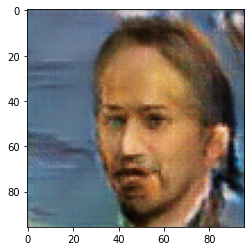

1200
tf.Tensor(4.4942055, shape=(), dtype=float32) tf.Tensor(0.15630311, shape=(), dtype=float32)


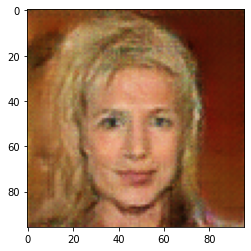

1800
tf.Tensor(4.531364, shape=(), dtype=float32) tf.Tensor(0.144315, shape=(), dtype=float32)


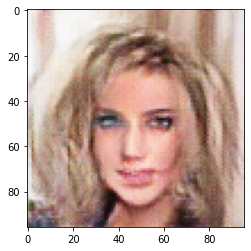

2400
tf.Tensor(4.525664, shape=(), dtype=float32) tf.Tensor(0.15669005, shape=(), dtype=float32)


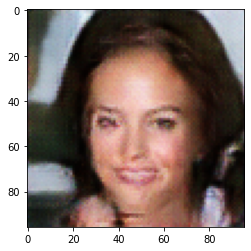

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 25, gen loss=4.556177139282227,disc loss=0.14728252589702606,
Accuracy:  0.8610494101387038
Accuracy on fake:  0.9105089096204156
600
tf.Tensor(4.66615, shape=(), dtype=float32) tf.Tensor(0.15254849, shape=(), dtype=float32)


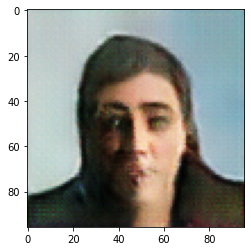

1200
tf.Tensor(4.5713673, shape=(), dtype=float32) tf.Tensor(0.18317509, shape=(), dtype=float32)


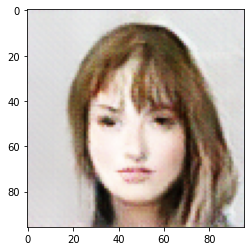

1800
tf.Tensor(4.600932, shape=(), dtype=float32) tf.Tensor(0.1635619, shape=(), dtype=float32)


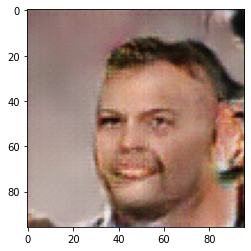

2400
tf.Tensor(4.58853, shape=(), dtype=float32) tf.Tensor(0.16982123, shape=(), dtype=float32)


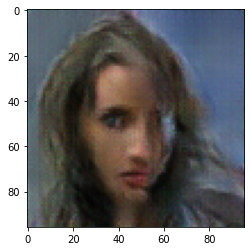

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 26, gen loss=4.581575870513916,disc loss=0.1646462231874466,
Accuracy:  0.5198677131151587
Accuracy on fake:  0.04037711634335357
600
tf.Tensor(4.607453, shape=(), dtype=float32) tf.Tensor(0.14899811, shape=(), dtype=float32)


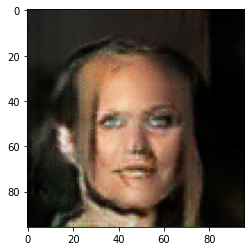

1200
tf.Tensor(4.616229, shape=(), dtype=float32) tf.Tensor(0.16527432, shape=(), dtype=float32)


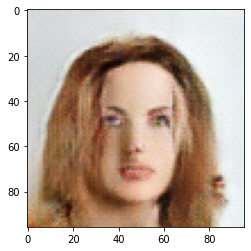

1800
tf.Tensor(4.63914, shape=(), dtype=float32) tf.Tensor(0.14517638, shape=(), dtype=float32)


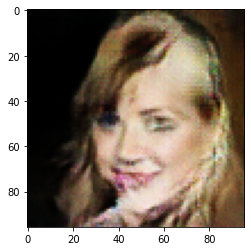

2400
tf.Tensor(4.608155, shape=(), dtype=float32) tf.Tensor(0.16335022, shape=(), dtype=float32)


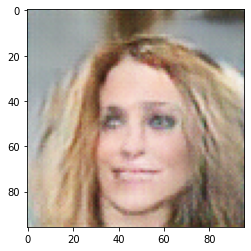

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 27, gen loss=4.611066818237305,disc loss=0.15940189361572266,
Accuracy:  0.8457722493706501
Accuracy on fake:  0.8952564292413249
600
tf.Tensor(4.821151, shape=(), dtype=float32) tf.Tensor(0.11042962, shape=(), dtype=float32)


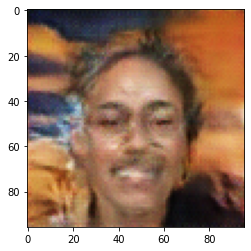

1200
tf.Tensor(4.721681, shape=(), dtype=float32) tf.Tensor(0.15128577, shape=(), dtype=float32)


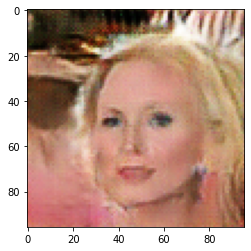

1800
tf.Tensor(4.6816015, shape=(), dtype=float32) tf.Tensor(0.15214503, shape=(), dtype=float32)


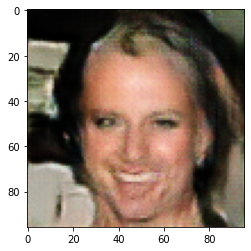

2400
tf.Tensor(4.6956944, shape=(), dtype=float32) tf.Tensor(0.14632177, shape=(), dtype=float32)


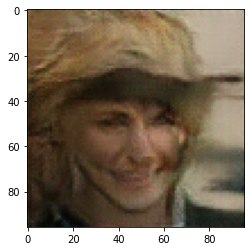

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 28, gen loss=4.700786590576172,disc loss=0.15299969911575317,
Accuracy:  0.5307517646478108
Accuracy on fake:  0.06550175230761637
600
tf.Tensor(4.4990296, shape=(), dtype=float32) tf.Tensor(0.1761449, shape=(), dtype=float32)


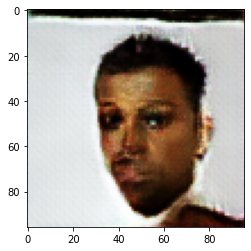

1200
tf.Tensor(4.589741, shape=(), dtype=float32) tf.Tensor(0.15886277, shape=(), dtype=float32)


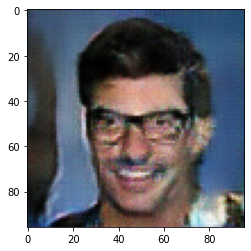

1800
tf.Tensor(4.6713657, shape=(), dtype=float32) tf.Tensor(0.14047255, shape=(), dtype=float32)


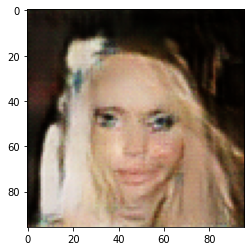

2400
tf.Tensor(4.6733384, shape=(), dtype=float32) tf.Tensor(0.1512402, shape=(), dtype=float32)


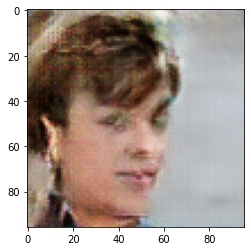

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 29, gen loss=4.686827182769775,disc loss=0.1474207639694214,
Accuracy:  0.8041117528012242
Accuracy on fake:  0.7355743126511674
600
tf.Tensor(4.7166924, shape=(), dtype=float32) tf.Tensor(0.16323027, shape=(), dtype=float32)


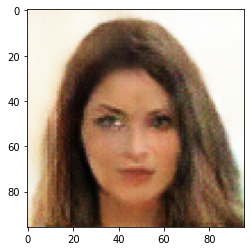

1200
tf.Tensor(4.7651134, shape=(), dtype=float32) tf.Tensor(0.1416229, shape=(), dtype=float32)


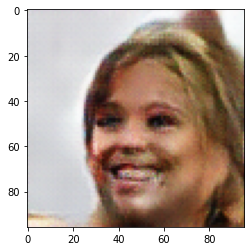

1800
tf.Tensor(4.7700367, shape=(), dtype=float32) tf.Tensor(0.14607018, shape=(), dtype=float32)


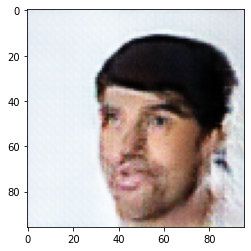

2400
tf.Tensor(4.7772427, shape=(), dtype=float32) tf.Tensor(0.14244078, shape=(), dtype=float32)


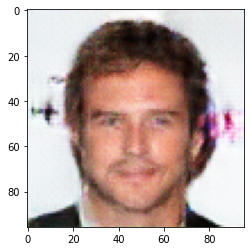

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 30, gen loss=4.7565083503723145,disc loss=0.1591462939977646,
Accuracy:  0.8316057061059282
Accuracy on fake:  0.8103065304309196
600
tf.Tensor(4.7579427, shape=(), dtype=float32) tf.Tensor(0.116134055, shape=(), dtype=float32)


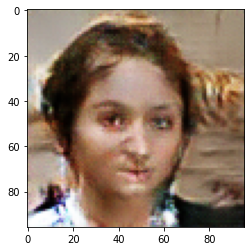

1200
tf.Tensor(4.8538804, shape=(), dtype=float32) tf.Tensor(0.10985223, shape=(), dtype=float32)


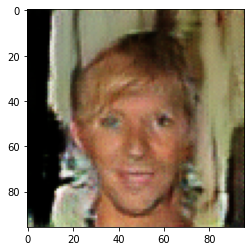

1800
tf.Tensor(4.8239417, shape=(), dtype=float32) tf.Tensor(0.13193831, shape=(), dtype=float32)


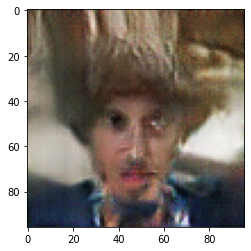

2400
tf.Tensor(4.841593, shape=(), dtype=float32) tf.Tensor(0.13705875, shape=(), dtype=float32)


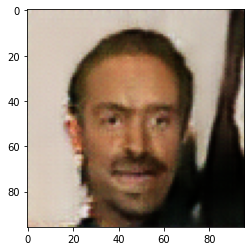

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 31, gen loss=4.815117359161377,disc loss=0.13753588497638702,
Accuracy:  0.8234364973591983
Accuracy on fake:  0.80171775507182
600
tf.Tensor(4.9065065, shape=(), dtype=float32) tf.Tensor(0.13980095, shape=(), dtype=float32)


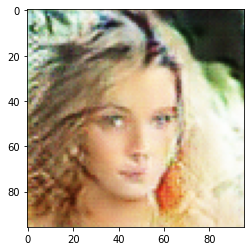

1200
tf.Tensor(4.8074036, shape=(), dtype=float32) tf.Tensor(0.14467043, shape=(), dtype=float32)


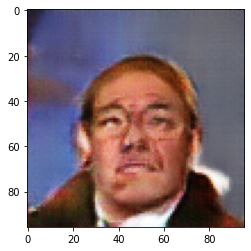

1800
tf.Tensor(4.813328, shape=(), dtype=float32) tf.Tensor(0.14307278, shape=(), dtype=float32)


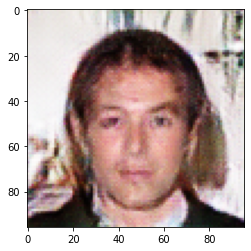

2400
tf.Tensor(4.8174148, shape=(), dtype=float32) tf.Tensor(0.13977939, shape=(), dtype=float32)


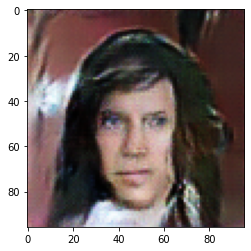

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 32, gen loss=4.801389217376709,disc loss=0.1483336091041565,
Accuracy:  0.6811787353768696
Accuracy on fake:  0.3940470901821413
600
tf.Tensor(4.942991, shape=(), dtype=float32) tf.Tensor(0.09600343, shape=(), dtype=float32)


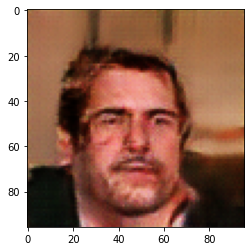

1200
tf.Tensor(5.019925, shape=(), dtype=float32) tf.Tensor(0.114217706, shape=(), dtype=float32)


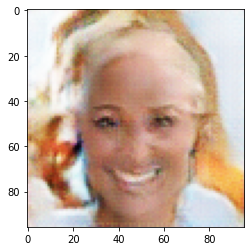

1800
tf.Tensor(4.954455, shape=(), dtype=float32) tf.Tensor(0.13171391, shape=(), dtype=float32)


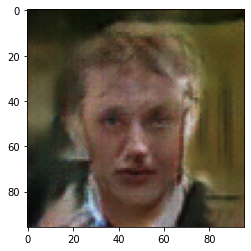

2400
tf.Tensor(4.985192, shape=(), dtype=float32) tf.Tensor(0.14059627, shape=(), dtype=float32)


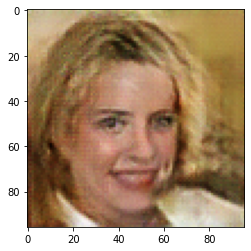

INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/generator-VL2-1/assets
INFO:tensorflow:Assets written to: /content/gdrive/MyDrive/discriminator-VL2-1/assets
Epoch 33, gen loss=4.945736885070801,disc loss=0.13853934407234192,
Accuracy:  0.5377116343353572
Accuracy on fake:  0.08292610691544498
600
tf.Tensor(4.82002, shape=(), dtype=float32) tf.Tensor(0.14377199, shape=(), dtype=float32)


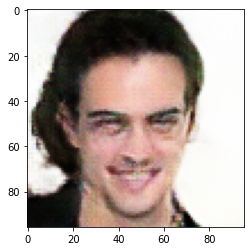

In [ ]:
fixed_seed = np.random.normal(0, 1, (PREVIEW_ROWS * PREVIEW_COLS, SEED_SIZE))
epochs = 40
bias = 1

for epoch in range(epochs):

  gen_loss_list = []
  disc_loss_list = []

  batchNum = 0
  for image_batch in trainData:
    t = train_step(image_batch)
    gen_loss_list.append(t[0])
    disc_loss_list.append(t[1])
    batchNum = batchNum + 1
    if batchNum % 600 == 0:
      print(batchNum)
      print(sum(gen_loss_list) / len(gen_loss_list), sum(disc_loss_list) / len(disc_loss_list))
      noise = tf.random.normal([1, SEED_SIZE])
      generated_image = generator(noise, training=False)
      plt.imshow(generated_image[0])
      plt.savefig("generatedImage"+str(epoch)+"-"+str(batchNum))
      plt.show()
  
  generator.save("/content/gdrive/MyDrive/generator-VL2-1")
  discriminator.save("/content/gdrive/MyDrive/discriminator-VL2-1")
  
  correct = 0
  correct_fake = 0
  totalSize = val_size*2
  for image_batch in valData:
    realVal, fakeVal = val_step(image_batch)
    realVal = realVal.numpy() > 0.5
    fakeVal = fakeVal.numpy() < 0.5
    correct = correct + np.count_nonzero(realVal) + np.count_nonzero(fakeVal)
    correct_fake = correct_fake + np.count_nonzero(fakeVal)

  g_loss = sum(gen_loss_list) / len(gen_loss_list)
  d_loss = sum(disc_loss_list) / len(disc_loss_list)

  print (f'Epoch {epoch+1}, gen loss={g_loss},disc loss={d_loss},')
  print ("Accuracy: ", 1.0*correct/totalSize)
  print ("Accuracy on fake: ", 1.0*correct_fake/val_size)